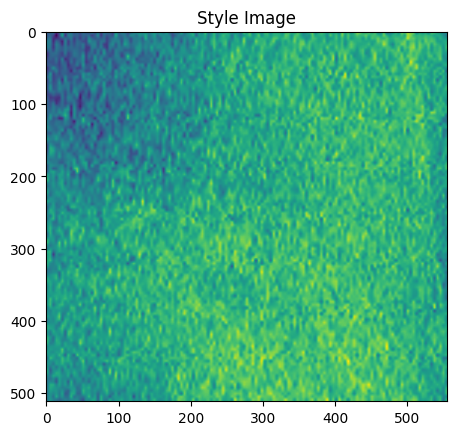

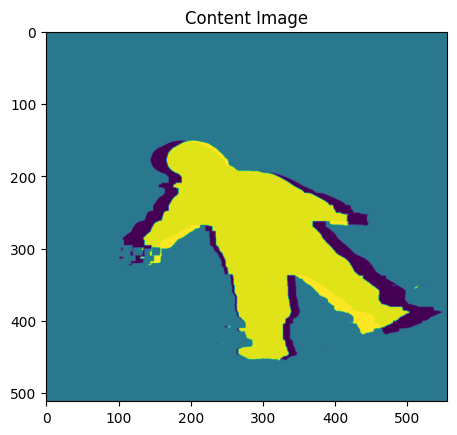

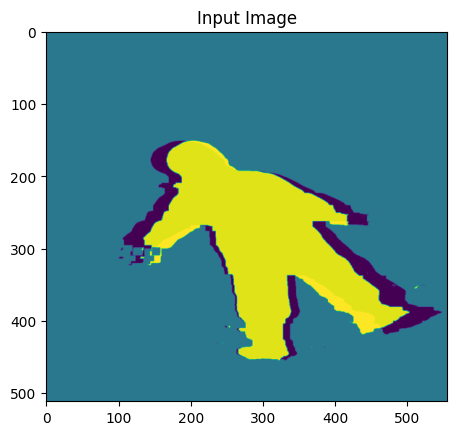

Model Building


<ipython-input-5-af700441f563>:73: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1)
<ipython-input-5-af700441f563>:74: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1)


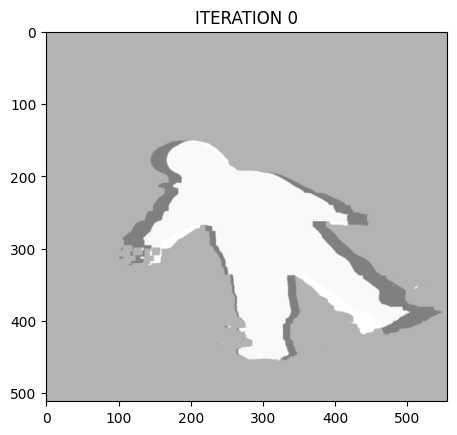

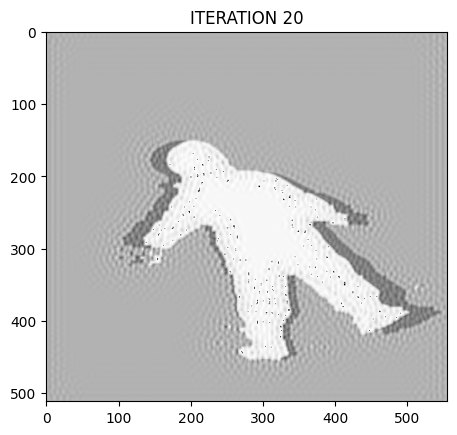

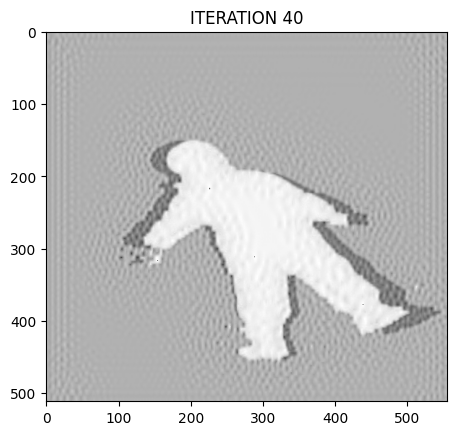

Style Loss: 18.0429 Content Loss: 5.8521



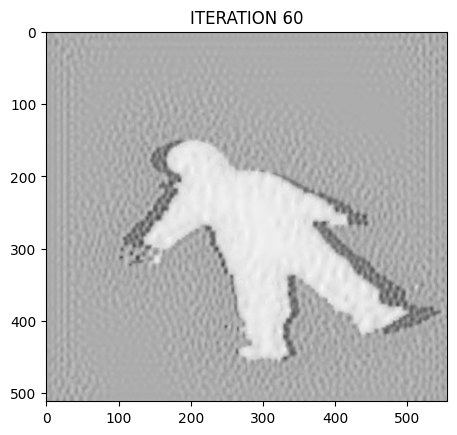

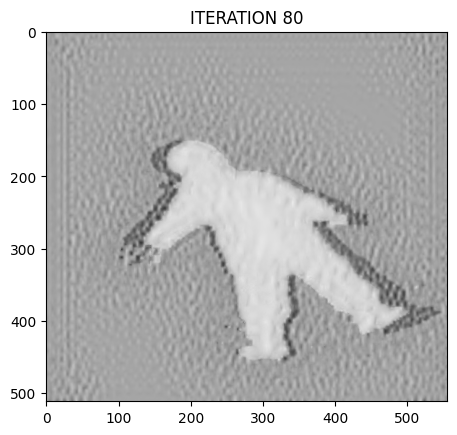

Style Loss: 3.6921 Content Loss: 6.4667



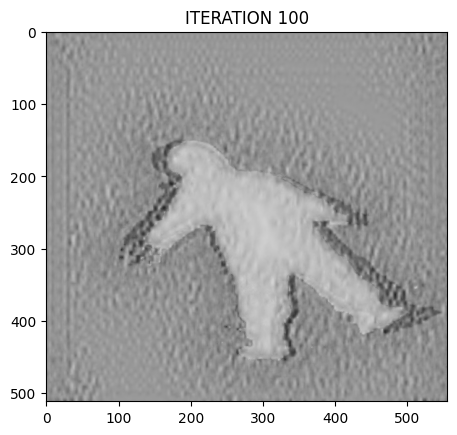

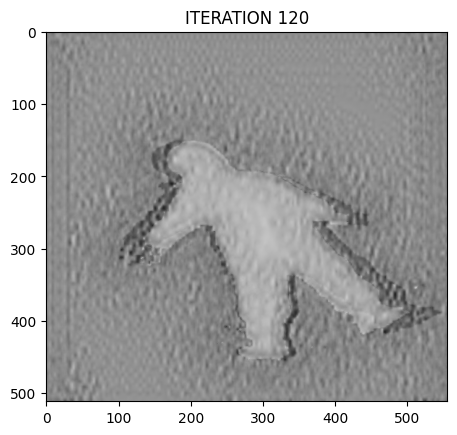

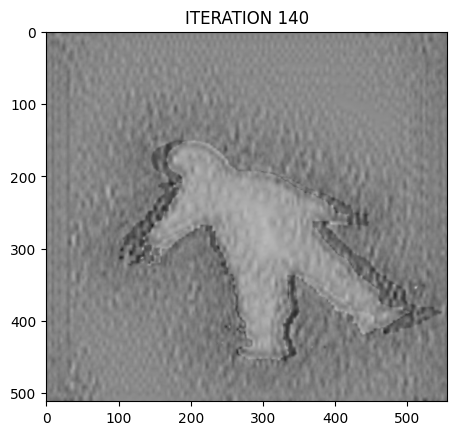

Style Loss: 0.3801 Content Loss: 5.9554



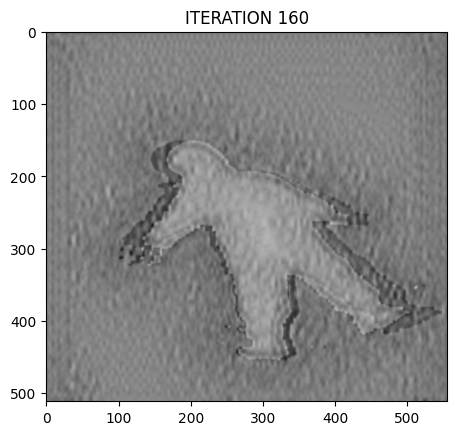

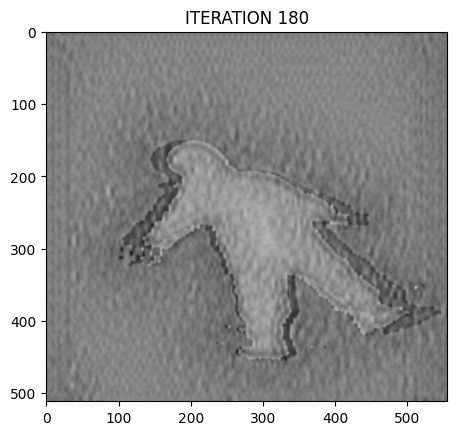

Style Loss: 0.3029 Content Loss: 5.4491



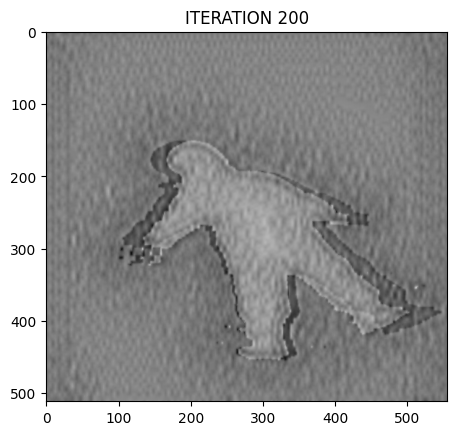

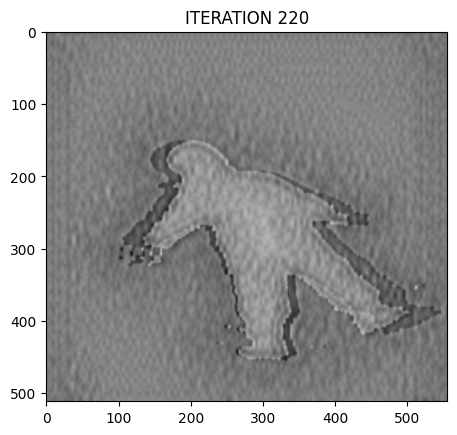

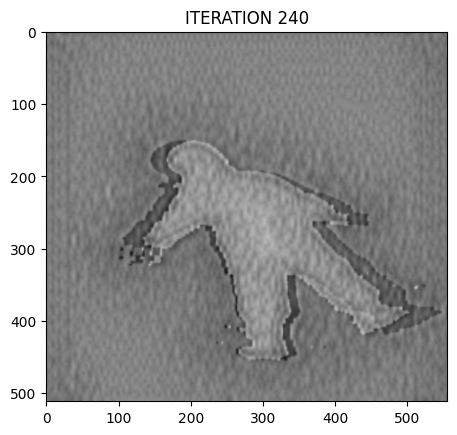

Style Loss: 0.2991 Content Loss: 5.2694



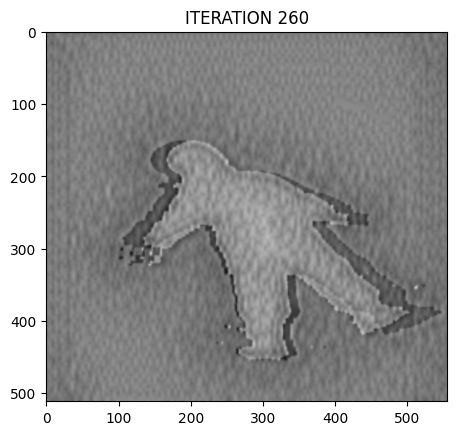

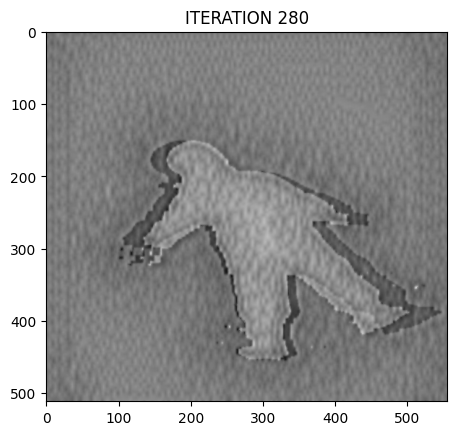

Style Loss: 0.3010 Content Loss: 5.2019



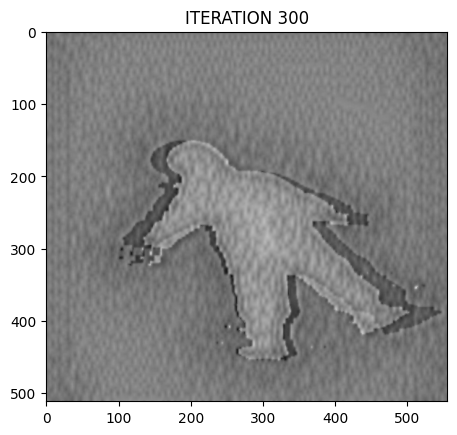

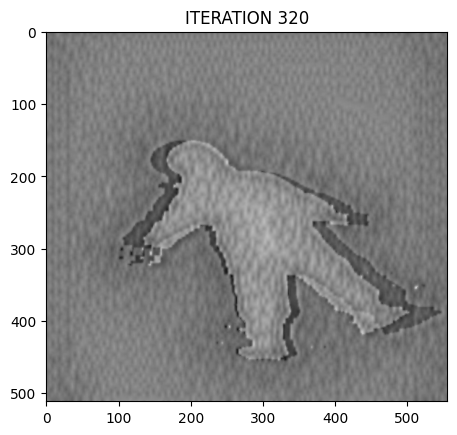

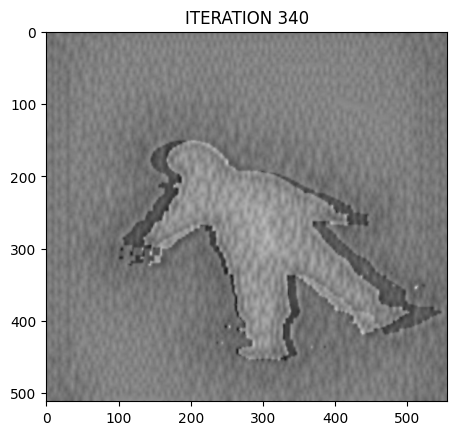

Style Loss: 0.3040 Content Loss: 5.1738



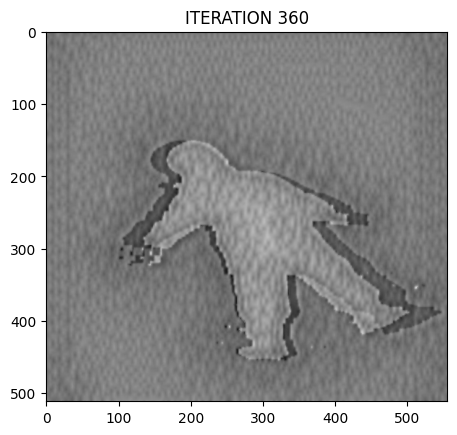

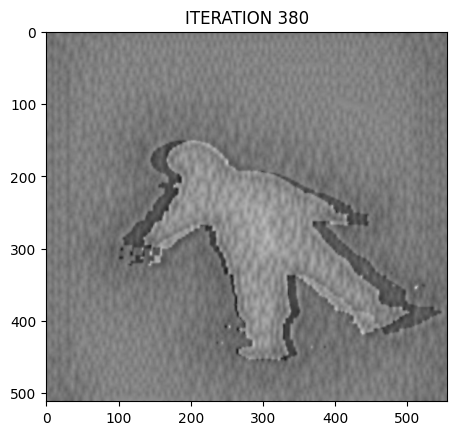

Style Loss: 0.3053 Content Loss: 5.1604



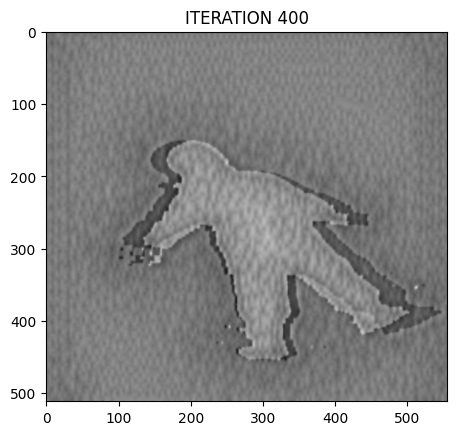

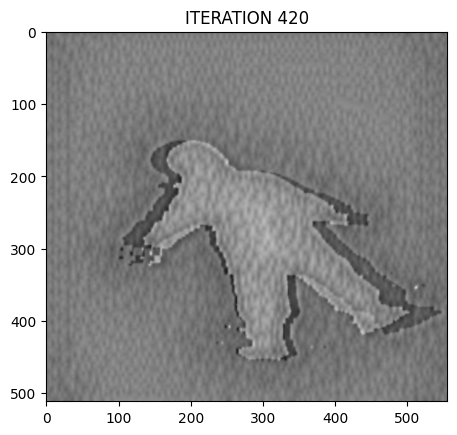

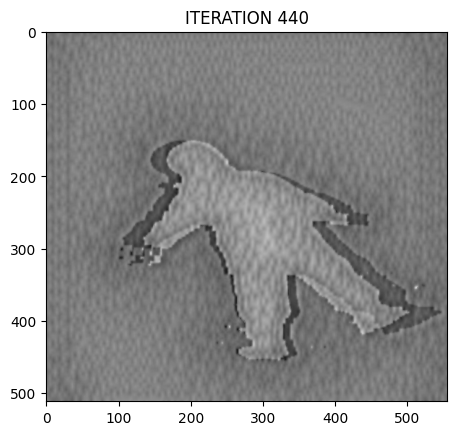

Style Loss: 0.3063 Content Loss: 5.1521



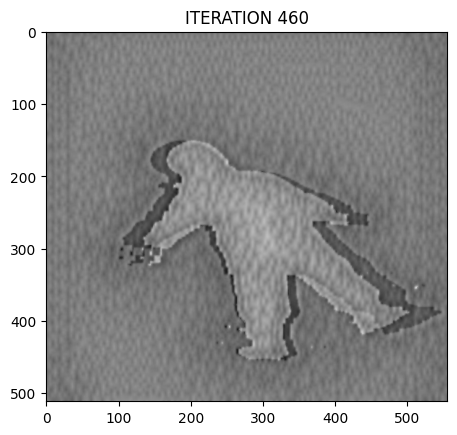

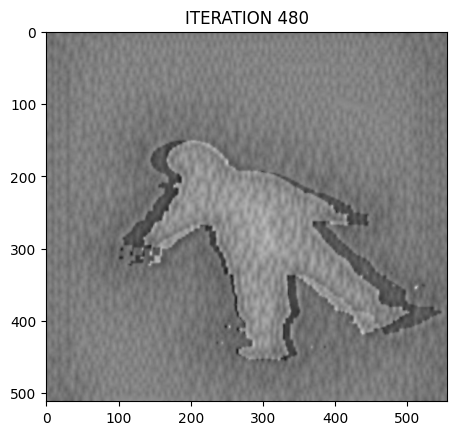

Style Loss: 0.3071 Content Loss: 5.1462



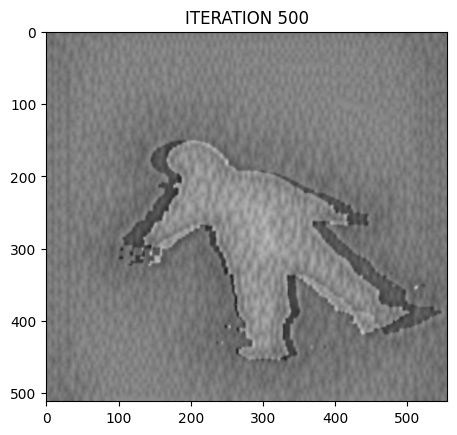

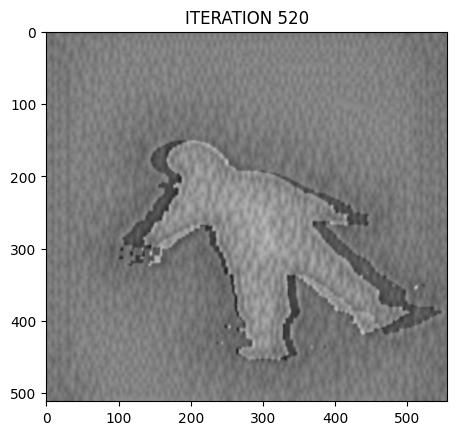

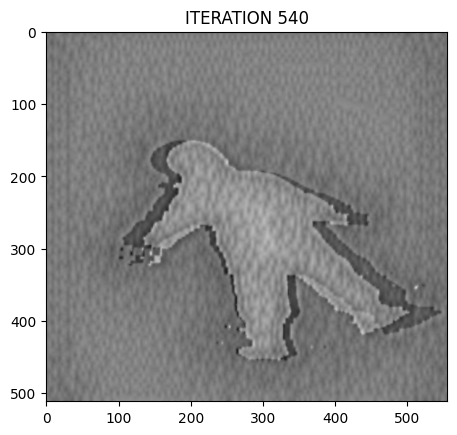

Style Loss: 0.3077 Content Loss: 5.1417



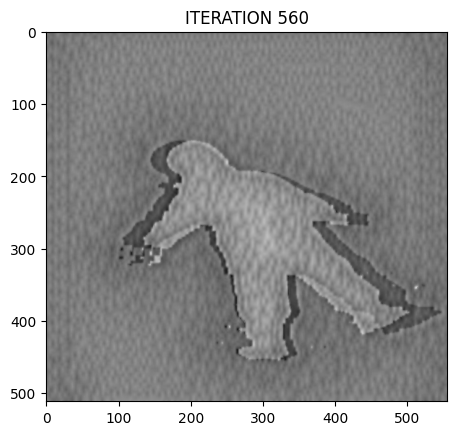

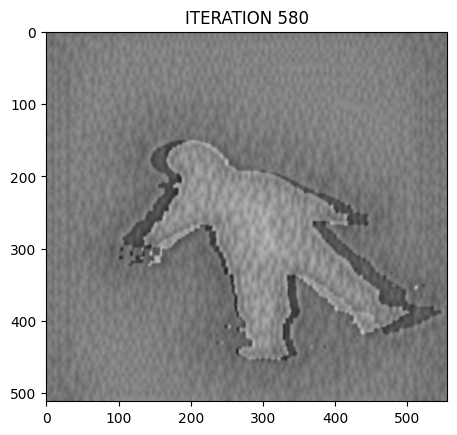

Style Loss: 0.3082 Content Loss: 5.1382



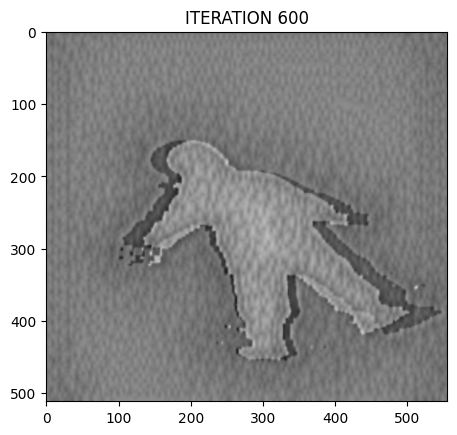

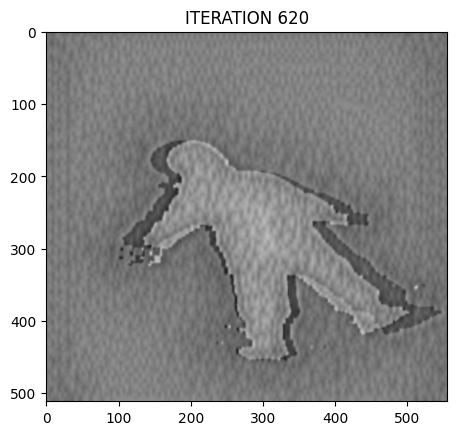

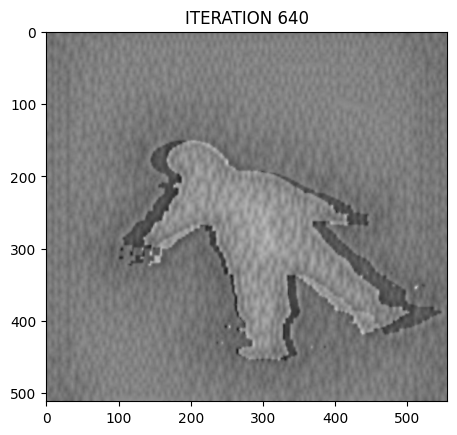

Style Loss: 0.3083 Content Loss: 5.1357



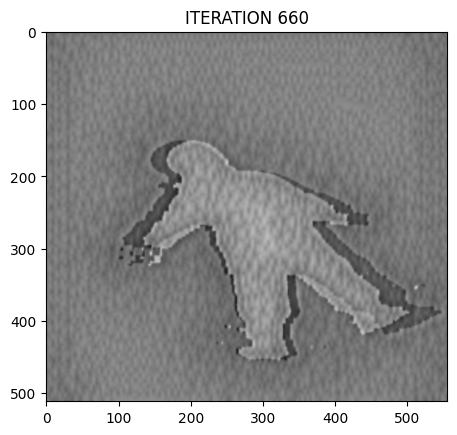

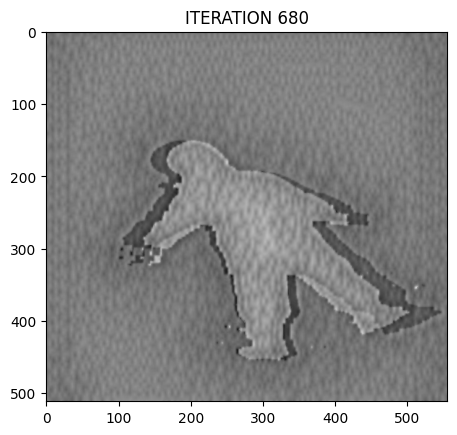

Style Loss: 0.3086 Content Loss: 5.1335



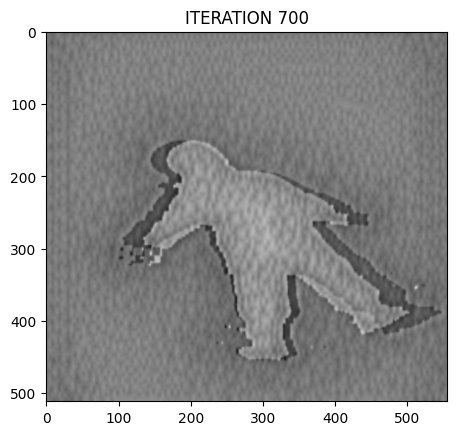

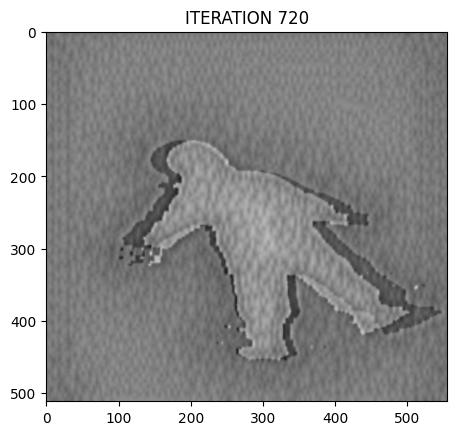

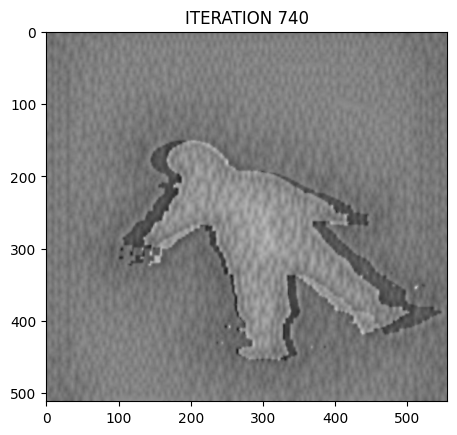

Style Loss: 0.3089 Content Loss: 5.1317



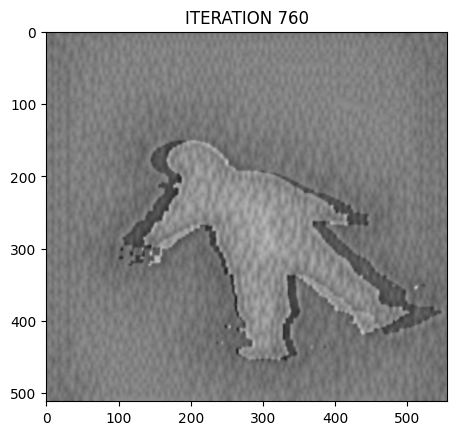

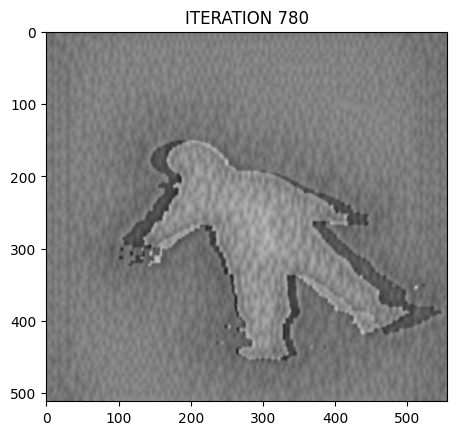

Style Loss: 0.3094 Content Loss: 5.1299



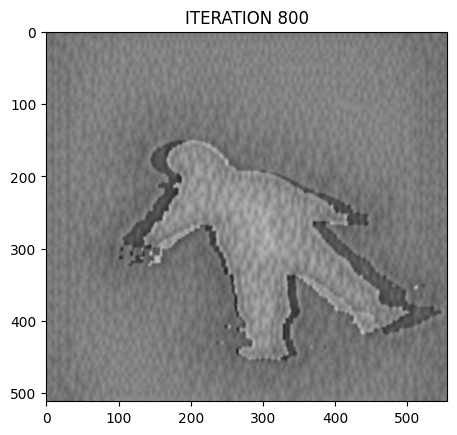

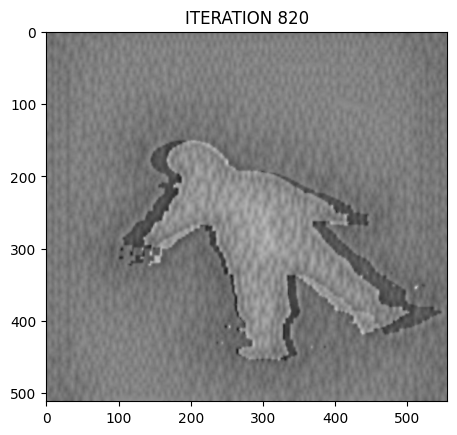

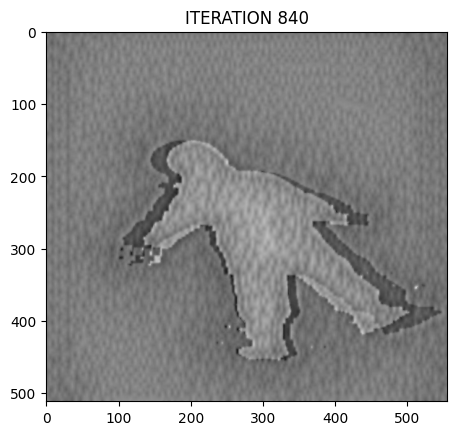

Style Loss: 0.3095 Content Loss: 5.1285



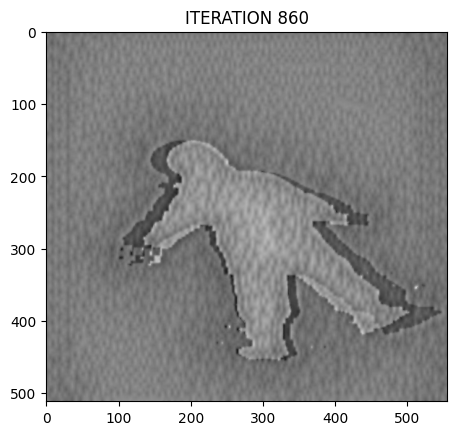

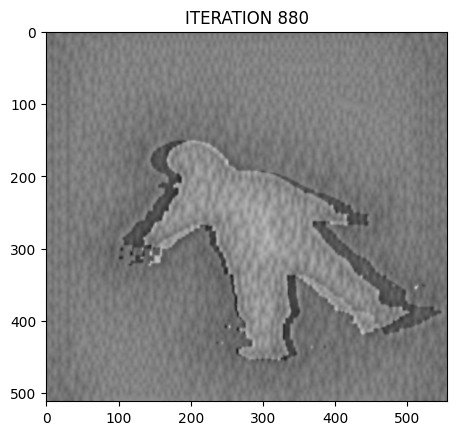

Style Loss: 0.3095 Content Loss: 5.1274



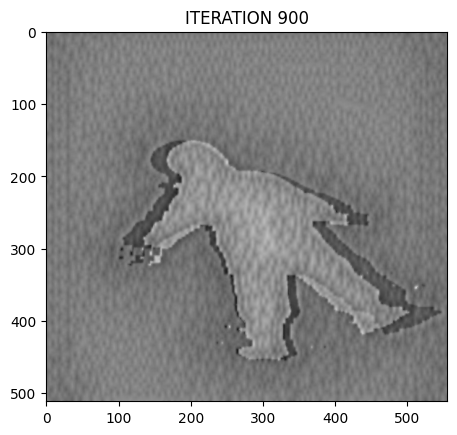

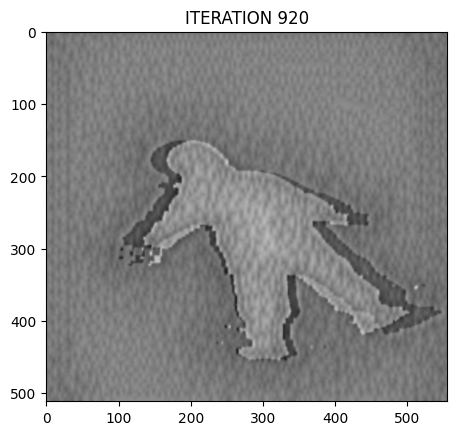

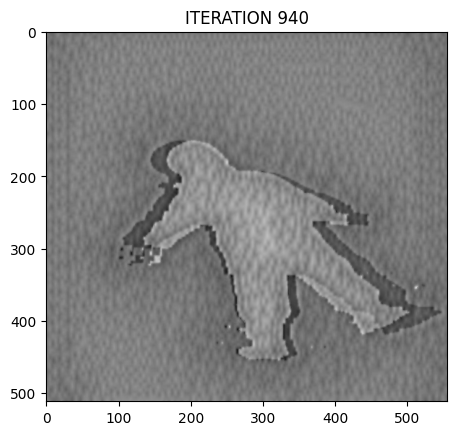

Style Loss: 0.3096 Content Loss: 5.1262



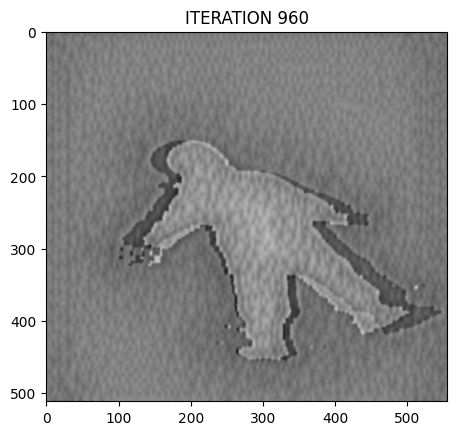

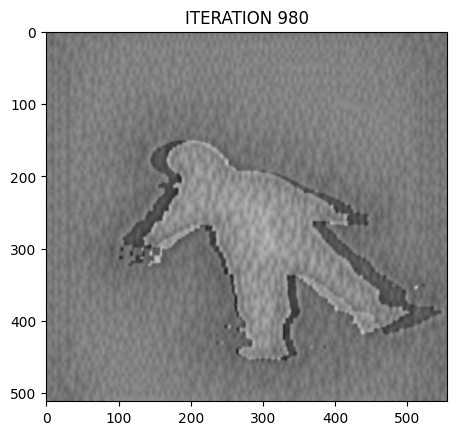

Style Loss: 0.3096 Content Loss: 5.1253



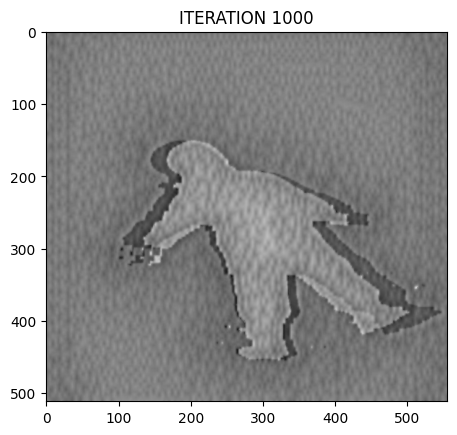

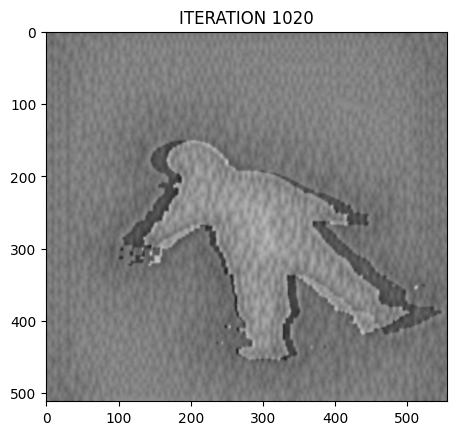

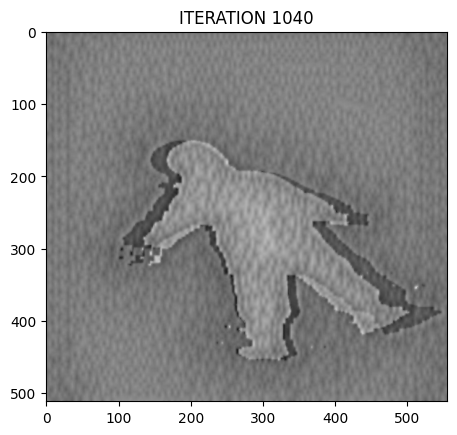

Style Loss: 0.3096 Content Loss: 5.1245



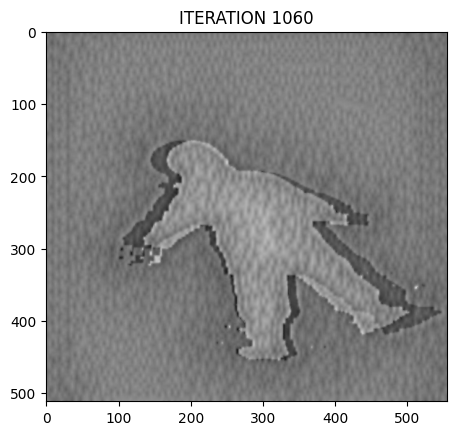

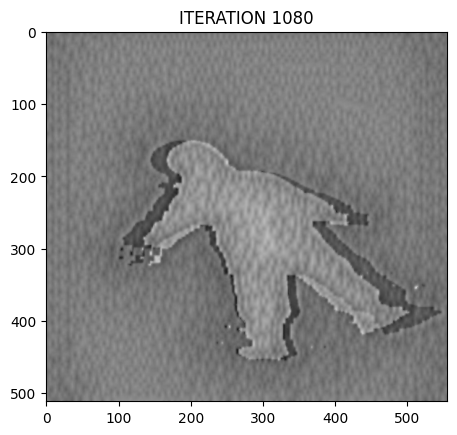

Style Loss: 0.3097 Content Loss: 5.1237



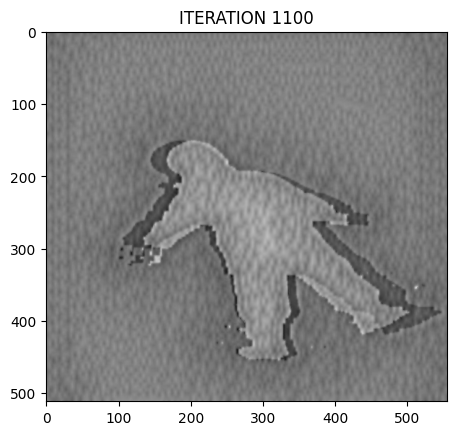

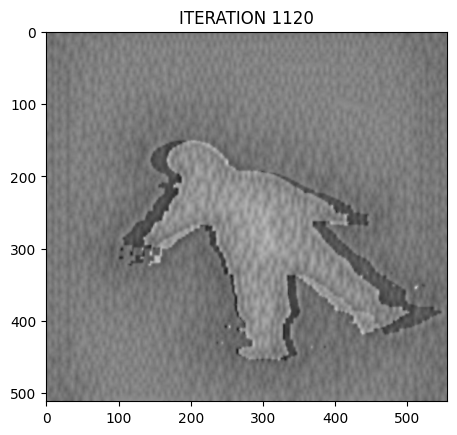

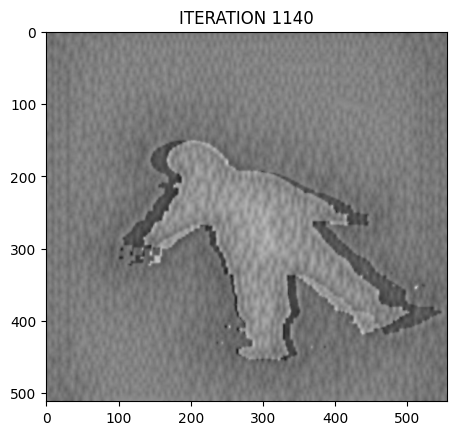

Style Loss: 0.3097 Content Loss: 5.1230



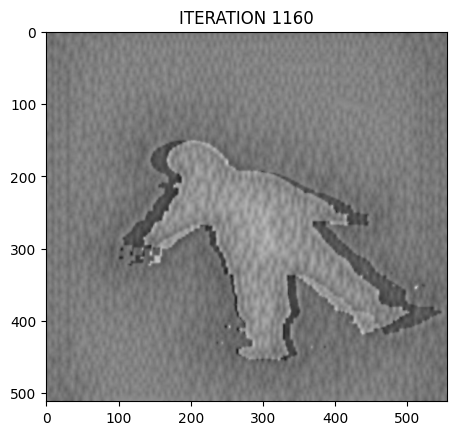

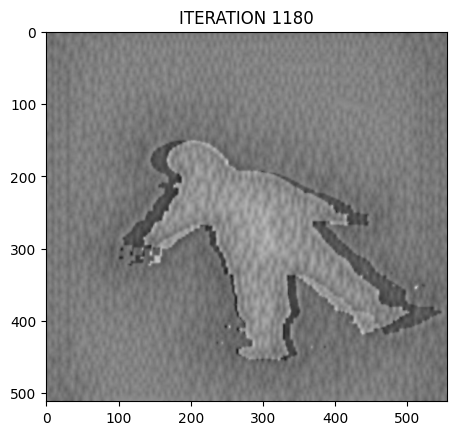

Style Loss: 0.3097 Content Loss: 5.1224



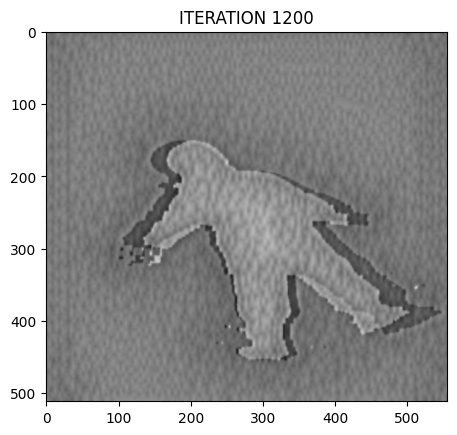

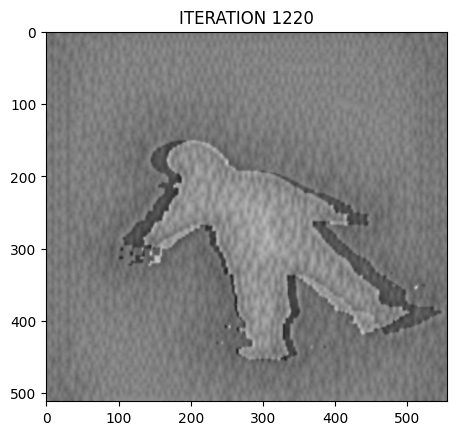

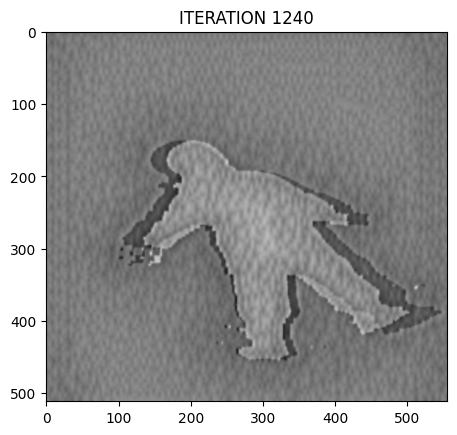

Style Loss: 0.3098 Content Loss: 5.1217



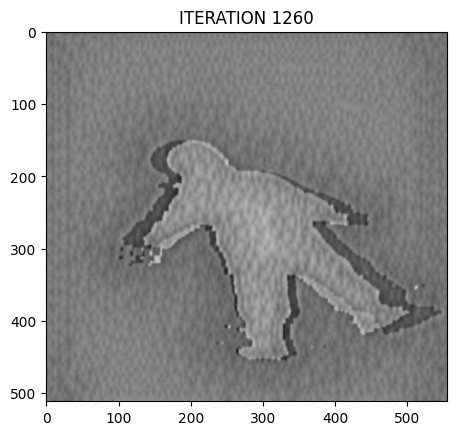

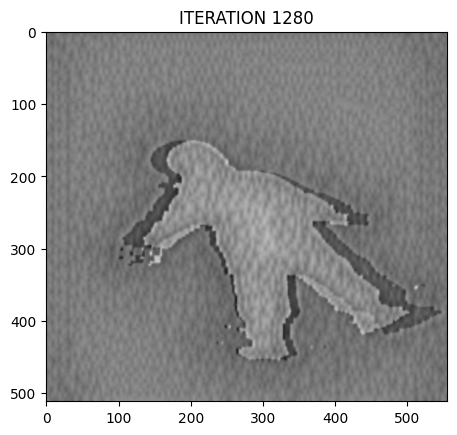

Style Loss: 0.3098 Content Loss: 5.1212



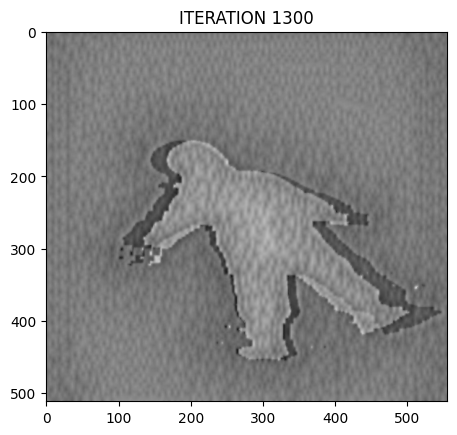

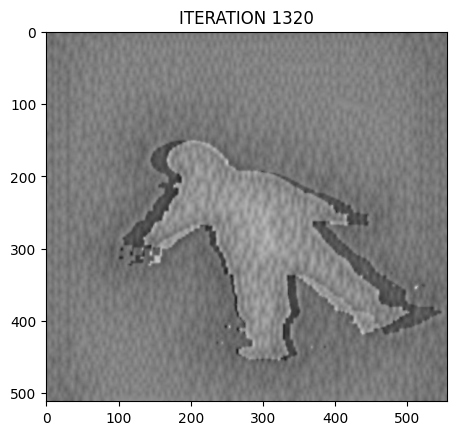

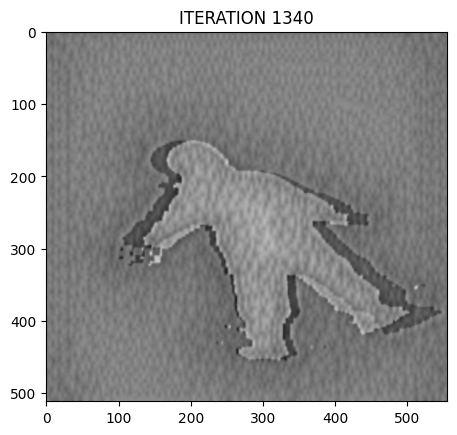

Style Loss: 0.3098 Content Loss: 5.1207



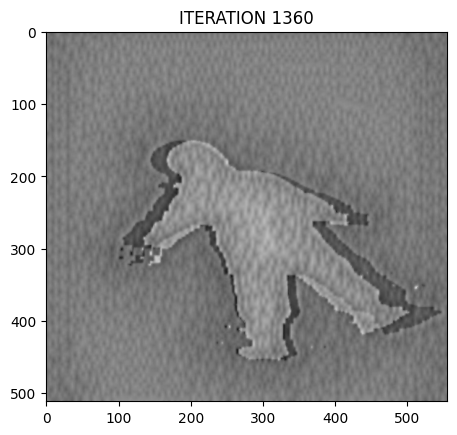

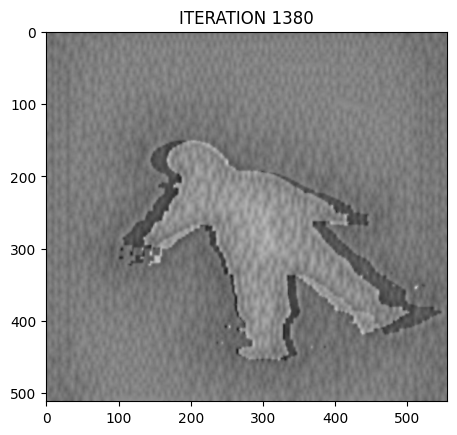

Style Loss: 0.3098 Content Loss: 5.1203



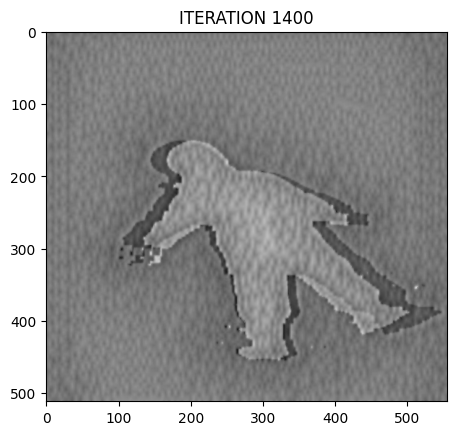

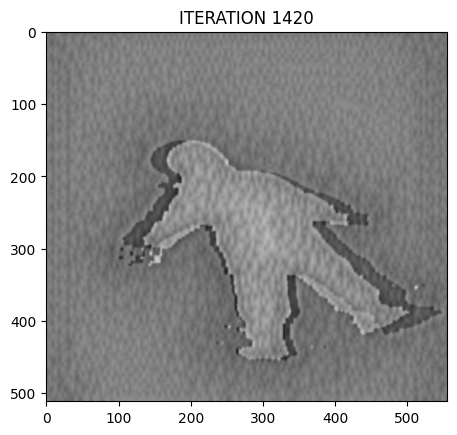

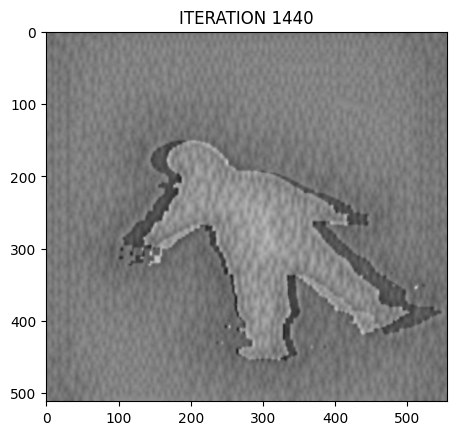

Style Loss: 0.3098 Content Loss: 5.1199



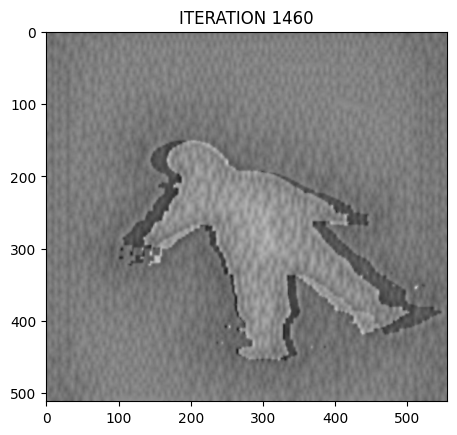

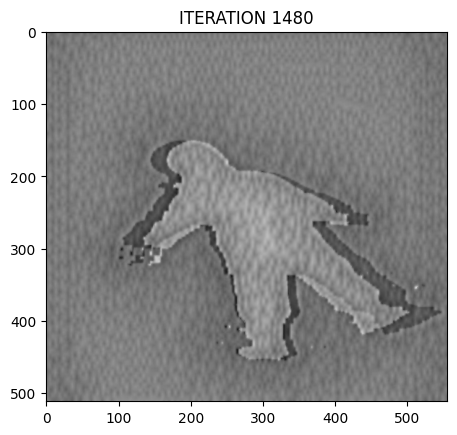

Style Loss: 0.3098 Content Loss: 5.1195



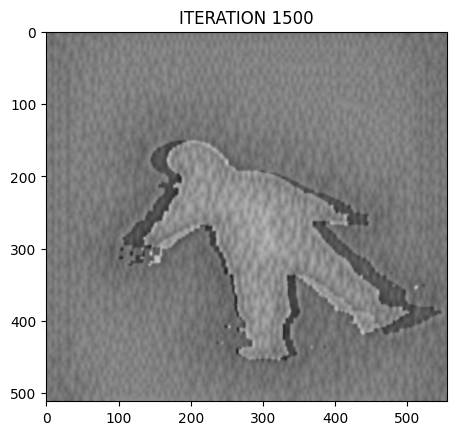

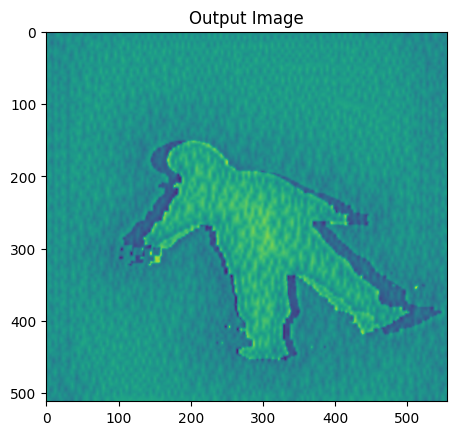

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
import torchvision.models as models

import copy


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#Experimental variables
content_layers_default = ['conv_4']
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

def image_loader(image_name, content_imsize, style_imsize):
    # Load content image
    content_loader = transforms.Compose([transforms.Resize(content_imsize), transforms.ToTensor()])
    content_image = Image.open(image_name['content'])
    content_image = content_loader(content_image).unsqueeze(0).to(device, torch.float)

    # Load style image and resize it to match the content image's size
    style_loader = transforms.Compose([transforms.Resize(content_imsize), transforms.ToTensor()])
    style_image = Image.open(image_name['style'])
    style_image = style_loader(style_image).unsqueeze(0).to(device, torch.float)

    return content_image, style_image
def imshow(tensor,title):

    unloader = transforms.ToPILImage()
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = unloader(image)
    plt.imshow(image)
    plt.title(title)
    plt.pause(0.001)

def gram_matrix(input):
    batch_size, no_feature_maps, d1, d2 = input.size()
    # (d1,d2)=dimensions of a f. map (N=d1*d2)
    features = input.view(batch_size*no_feature_maps, d1*d2)  # resise F_XL into \hat F_XL
    # computing the gram product
    G = torch.mm(features, features.t())
    #normalizing
    return G.div(batch_size*no_feature_maps*d1*d2)


class ContentLoss(nn.Module):
    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        self.target = target.detach()
    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()
    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        return (img - self.mean) / self.std



# This type of optimizer was prefered by the author of the paper
def get_input_optimizer(input_img):
    # this line to show that input is a parameter that requires a gradient
    optimizer = optim.LBFGS([input_img.requires_grad_()])
    return optimizer

def get_style_model_and_losses(cnn, normalization_mean, normalization_std,style_img, content_img,content_layers=content_layers_default,style_layers=style_layers_default):
    cnn = copy.deepcopy(cnn)

    # normalization
    normalization = Normalization(normalization_mean, normalization_std).to(device)

    content_losses = []
    style_losses = []

    # make a new nn.Sequential to put in modules that are supposed to be activated sequentially
    model = nn.Sequential(normalization)

    i = 0
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_%d'%i
        elif isinstance(layer, nn.ReLU):
            name = 'relu_%d'%i
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_%d'%i
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_%d'%i
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            # add content loss:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_%d"%i, content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            # add style loss:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_%d"%i, style_loss)
            style_losses.append(style_loss)

    #pretty much that ok so this last part we're gonna just trim off the last layers because we
    # don't care about them it's fully connected feed-forward layers that are used for the output
    # we're not trying to do object recognition here we're trying to do generating an image so we can remove them it doesn't there that they don't
    for i in range(len(model)-1,-1,-1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses


# This will run the neural style transfer
# It will create image that goes above 1 or below 0, however it will be normalized
def run_style_transfer(model, style_losses, content_losses, input_img, num_steps=300, style_weight=1000000, content_weight=1):
    optimizer = get_input_optimizer(input_img)
    run = [0]

    while run[0] <= num_steps:
        def closure():
            # Correct the values of the updated input image
            input_img.data.clamp_(0, 1)
            optimizer.zero_grad()
            model(input_img)

            style_score = 0
            content_score = 0

            for style_layer in style_losses:
                style_score += (1/5) * style_layer.loss
            for content_layer in content_losses:
                content_score += content_layer.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print('Style Loss: {:.4f} Content Loss: {:.4f}\n'.format(style_score.item(), content_score.item()))

            return style_score + content_score

        imshow(input_img.expand(-1, 3, -1, -1), "ITERATION %d" % run[0])

        optimizer.step(closure)
    # A last correction to have the tensors between 0 and 1
    input_img.data.clamp_(0, 1)

    return input_img


imsize = 512 if torch.cuda.is_available() else 128


imsize_content = (512, 556)
imsize_style = (512, 556)

image_names = {
    'content': "content.jpeg",
    'style': "style.jpeg"
}

content_img, style_img = image_loader(image_names, imsize_content, imsize_style)

#content_img, style_img= content_img.expand(-1, 3, -1, -1),style_img.expand(-1, 3, -1, -1)

#assert style_img.size() == content_img.size()

plt.ion()

plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(content_img, title='Content Image')


# Importing the VGG 19 model
cnn = models.vgg19(pretrained=True).features.to(device).eval()

#The image the starting image weare modifying and outputting remember
input_img = content_img.clone()

#input_img = torch.randn(content_img.data.size(), device=device)

# add the original input image to the figure:
plt.figure()
imshow(input_img, title='Input Image')



# VGG network are normalized with special values for the mean and std
#These values are from the data they are trained on
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

no_steps=3000


print('Model Building')
model, style_losses, content_losses = get_style_model_and_losses(cnn,cnn_normalization_mean, cnn_normalization_std, style_img, content_img, content_layers_default, style_layers_default)

output = run_style_transfer(model, style_losses, content_losses, input_img,num_steps=1500)

plt.figure()
imshow(output, title='Output Image')


plt.ioff()
plt.show()



In [ ]:
imshow(output.expand(-1, 3, -1, -1),"output")

In [ ]:
def run_style_transfer(model, style_losses, content_losses, input_img, num_steps=300, style_weight=1000000, content_weight=1):
    optimizer = get_input_optimizer(input_img)
    run = [0]

    while run[0] <= num_steps:
        def closure():
            # Correct the values of the updated input image
            input_img.data.clamp_(0, 1)
            optimizer.zero_grad()
            model(input_img)

            style_score = 0
            content_score = 0

            for style_layer in style_losses:
                style_score += (1/5) * style_layer.loss
            for content_layer in content_losses:
                content_score += content_layer.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print('Style Loss: {:.4f} Content Loss: {:.4f}\n'.format(style_score.item(), content_score.item()))

            return style_score + content_score

        imshow(input_img, "ITERATION %d" % run[0])

        optimizer.step(closure)

    # A last correction to have the tensors between 0 and 1
    input_img.data.clamp_(0, 1)

    return input_img


In [ ]:
import torch



# Replicate the grayscale channel to create three channels for RGB
rgb_image_tensor = style_img.expand(-1, 3, -1, -1)

# Now, `rgb_image_tensor` is a 3-channel RGB image tensor with the same content as the original grayscale image.

# Verify the shape of the resulting tensor
imshow(rgb_image_tensor,"style")  # It should be [1, 3, 512, 556]


In [ ]:
print(style_img.shape)
print(content_img.shape)

This code is often used in neural style transfer, and the optimizer choice, in this case, is L-BFGS (Limited-memory Broyden-Fletcher-Goldfarb-Shanno). L-BFGS is a popular optimization algorithm for unconstrained optimization problems, and it's commonly used for style transfer due to its effectiveness in handling optimization challenges specific to this task.

The reason L-BFGS is commonly used in neural style transfer is that it's well-suited for optimizing high-dimensional problems like image generation, where the generated image pixels are the optimization variables. L-BFGS efficiently handles optimization problems with a large number of variables by approximating the inverse Hessian matrix and using it to guide the optimization process.



The VGG-19 model that you imported has a total of 19 layers. It's a deep convolutional neural network architecture that consists of 16 convolutional layers and 3 fully connected layers. The "19" in the model's name refers to the total number of layers in the network.

The architecture is organized into blocks, where each block contains multiple convolutional layers followed by a pooling layer. The first few blocks focus on capturing low-level features like edges and textures, while the deeper blocks capture higher-level features like object parts and complex patterns.

Here's a breakdown of the layers in VGG-19:

Convolutional Blocks (with ReLU activation and optional BatchNormalization):

2 or 3 Convolutional layers (with small filters like 3x3)
1 MaxPooling layer (typically with 2x2 kernel and stride)
Fully Connected (FC) Layers:

3 FC layers
The last FC layer produces the final classification scores (1000 classes for ImageNet)